# Data Mining -  Computer Assignment 3
Mohammad Saadati - 
_810198410_

## Introduction

In 2014, a team of researchers collected data on diabetes patients from dozens of hospitals and clinics in the United States in an article entitled [Impact of HbA1c Measurement on Hospital Readmission Rates: Analysis of 70,000 Clinical Database Patient Records](https://www.hindawi.com/journals/bmri/2014/781670/). Some of this information has been made available to the public (Anonymously), which includes one hundred thousand items with fifty features[.](https://archive-beta.ics.uci.edu/ml/datasets/diabetes+130+us+hospitals+for+years+1999+2008)

In this project, we use **clustering** algorithms such as `K-means` and `DBSCAN` to cluster the given data.


### Import Libraries
First of all, we import necessary libraries to use their functions.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
# !pip install product
from itertools import product

from google.colab import drive
drive.mount('/content/drive')

plt.rcParams["font.family"] = "serif"

Mounted at /content/drive


## Part 1: Preprocessing
Data Preprocessing or Data Preparation is a data mining technique that transforms raw data into an understandable format for ML algorithms. Real-world data usually is noisy (contains errors, outliers, duplicates), incomplete (some values are missed), could be stored in different places and different formats. The task of Data Preprocessing is to handle these issues.

In the common ML pipeline, Data Preprocessing stage is between Data Collection stage and Training / Tunning Model.

Pre-processing is one of the most important steps in data mining projects. Various approaches are used in the field of lost data management and data conversion to other formats, and the careful selection of these approaches has a direct impact on the quality of the final results; Therefore, the best approach should always be identified and applied.

**Importance of Data Preprocessing stage**
1. Different ML models have different required input data (numerical data, images in specific format, etc). Without the right data, nothing will work.
2. Because of “bad” data, ML models will not give any useful results, or even may give wrong answers, that may lead to wrong decisions (GIGO principle).
3. The higher the quality of the data, the less data is needed.

First we load csv file as a DataFrame using pandas library.

In [2]:
# diabetic_data = pd.read_csv("./dataset_diabetes/diabetic_data.csv")
diabetic_data = pd.read_csv("drive/My Drive/UT/Term6/DM/CA3/dataset_diabetes/diabetic_data.csv")
diabetic_data

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In this part first in each column convert the values `?` to `NAN` then  we use two Pandas function `isna` and `sum` to count number of missing values at each column.

In [3]:
for column in diabetic_data:
    diabetic_data[column].replace({"?": np.nan}, inplace=True)
    
diabetic_data.isna().sum()

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

The `describe()` function returns descriptive statistics for every column of DataFrame.

In [4]:
diabetic_data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


The `info()` function returns a summary of DataFrame including data type and non-null values count of each column and also memory usage.

In [5]:
diabetic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      99493 non-null   object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    3197 non-null    object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                61510 non-null   object
 11  medical_specialty         51817 non-null   object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In this part, we plot the distribution of features.

Histograms are the simplest way to show how data is spread.

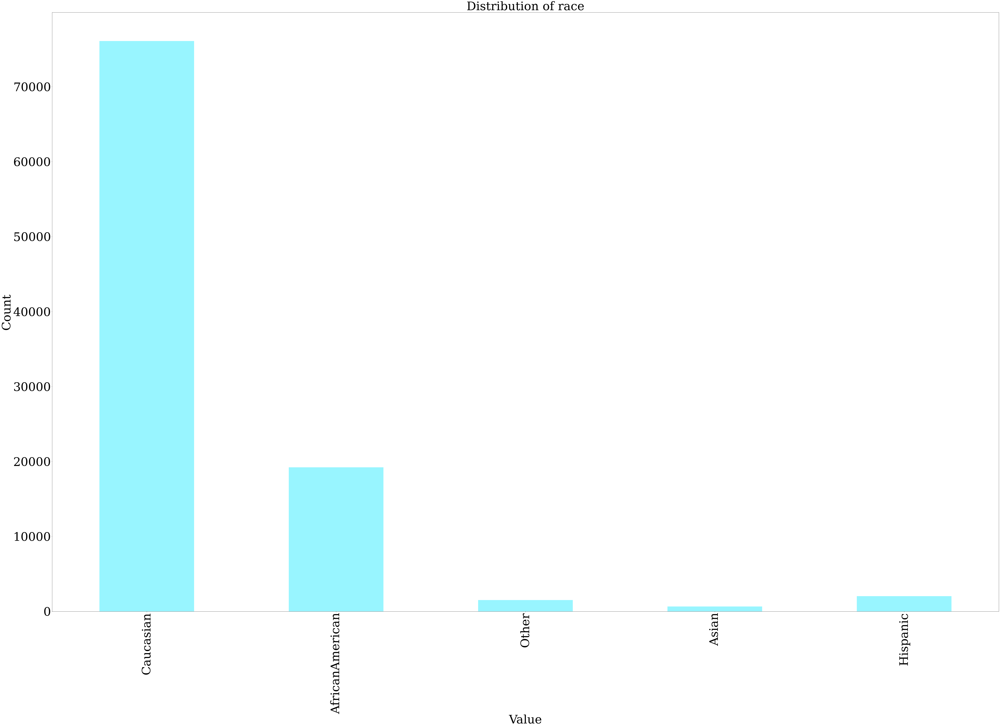

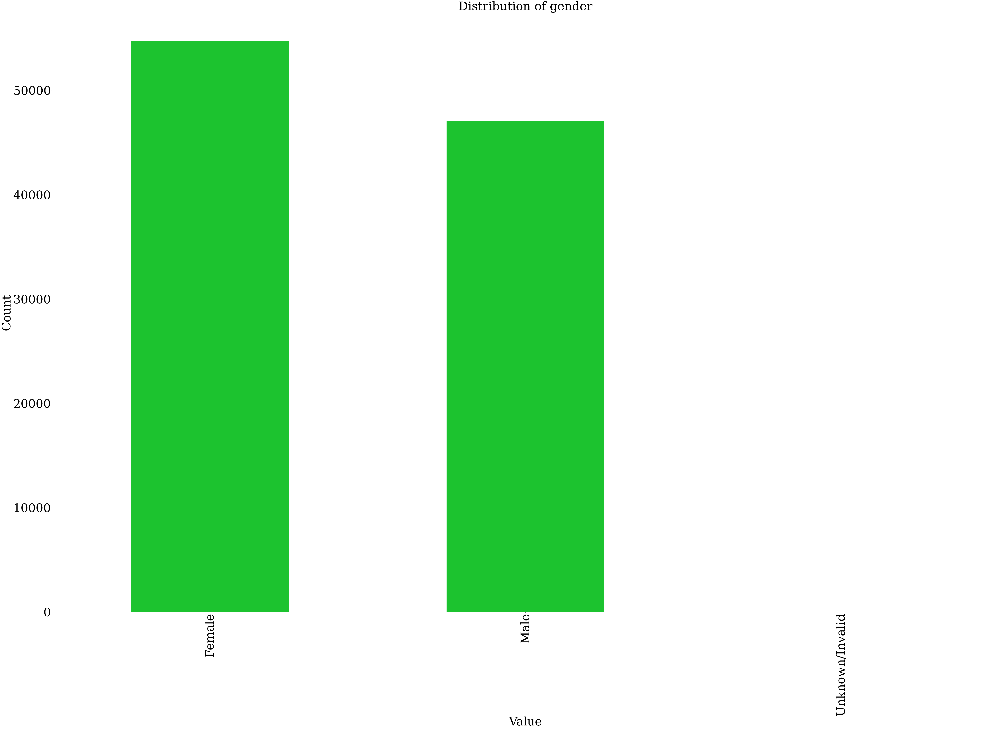

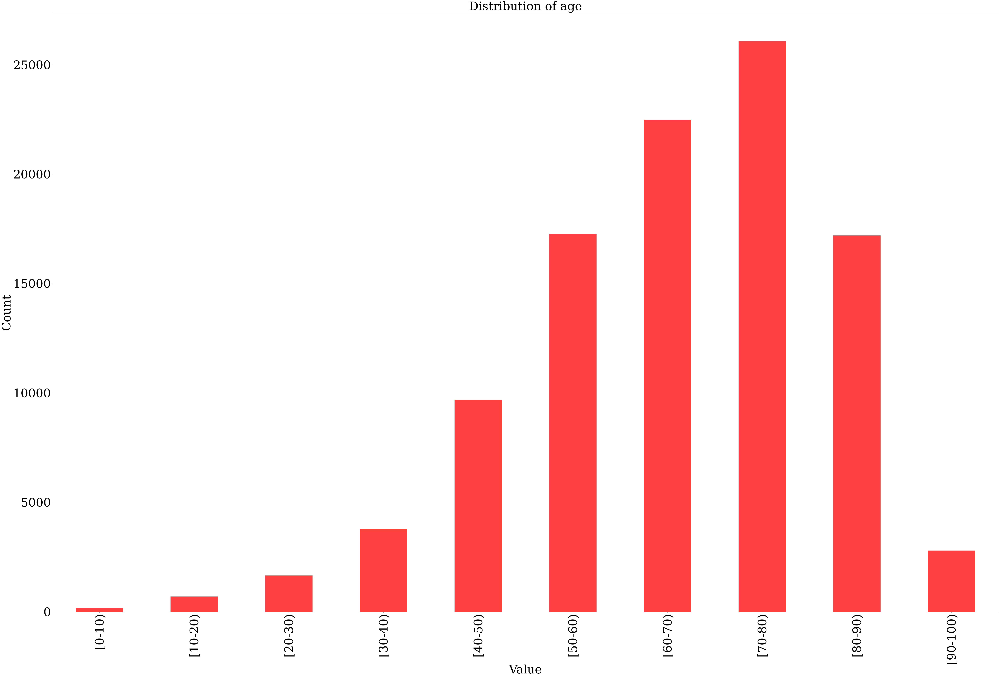

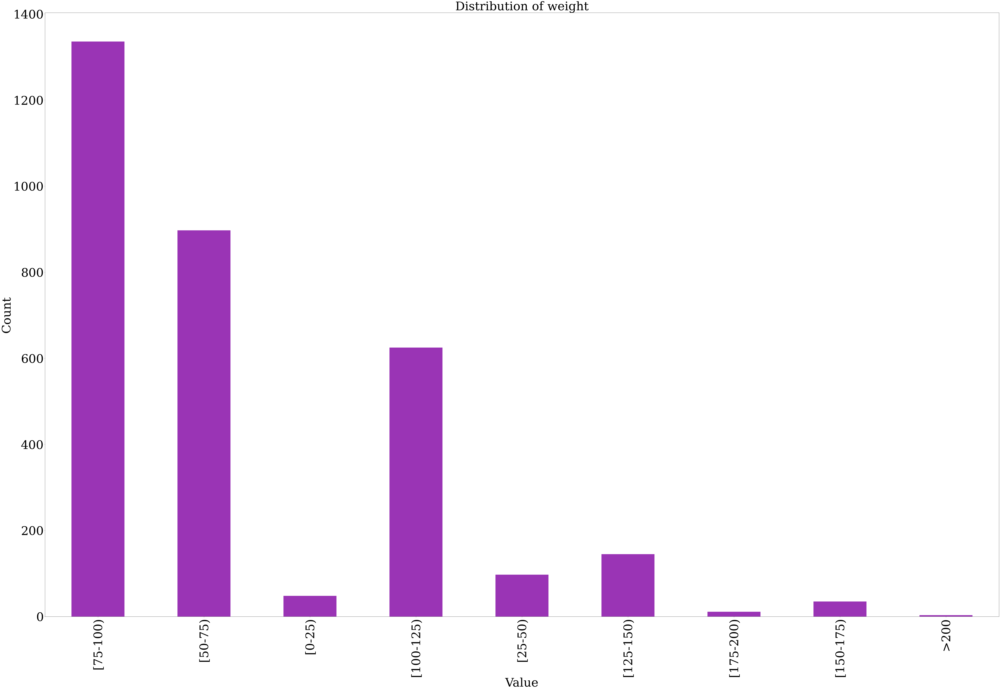

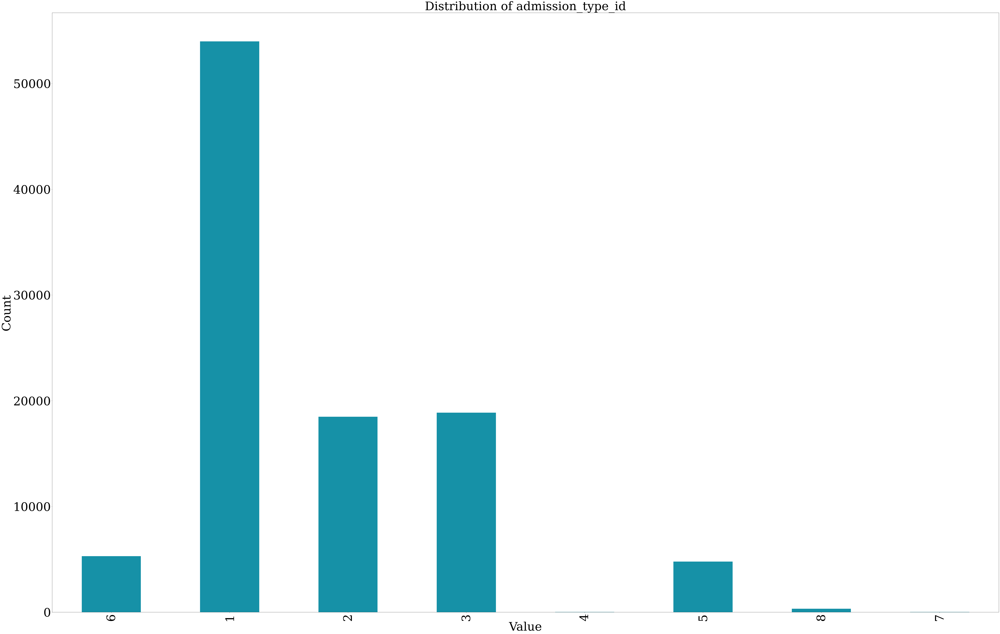

...

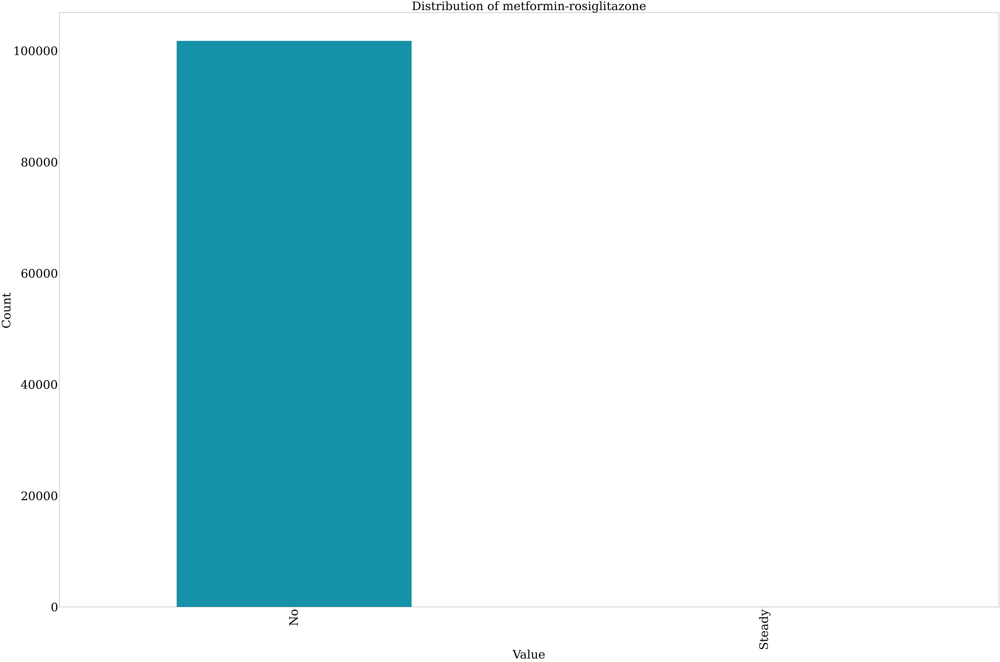

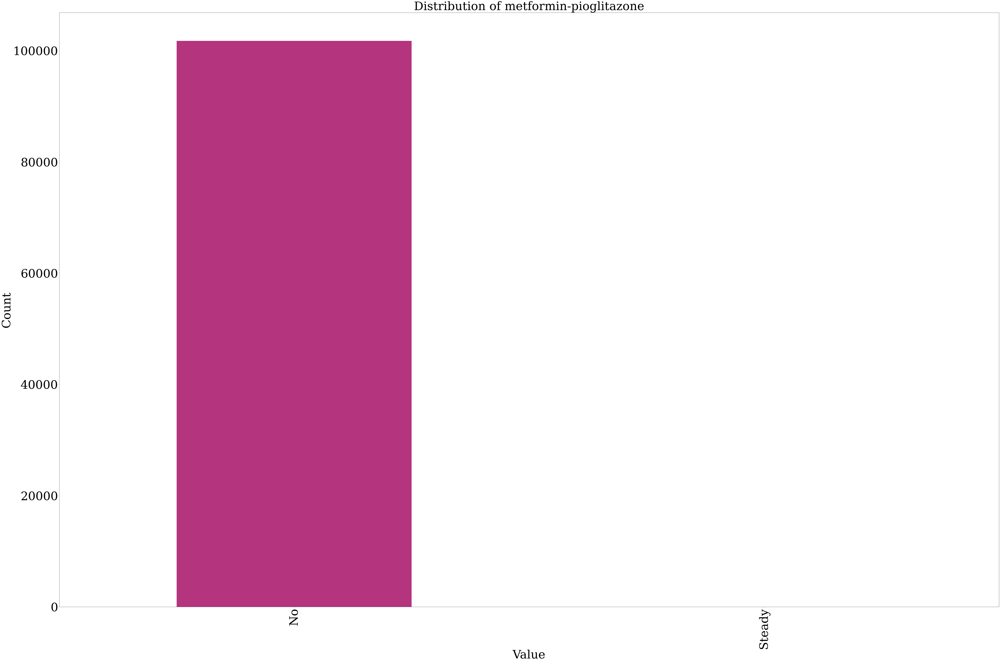

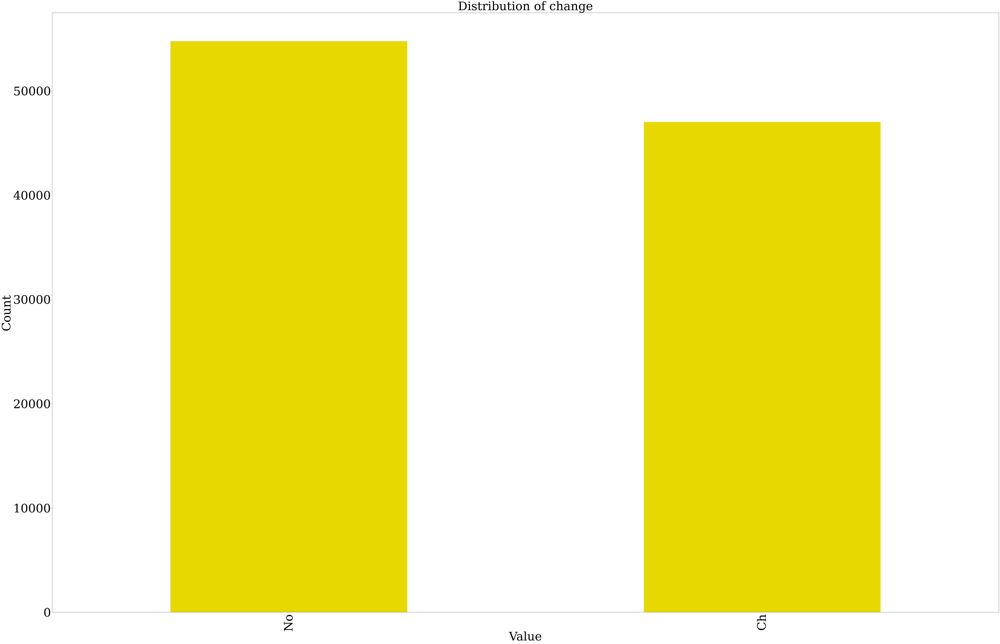

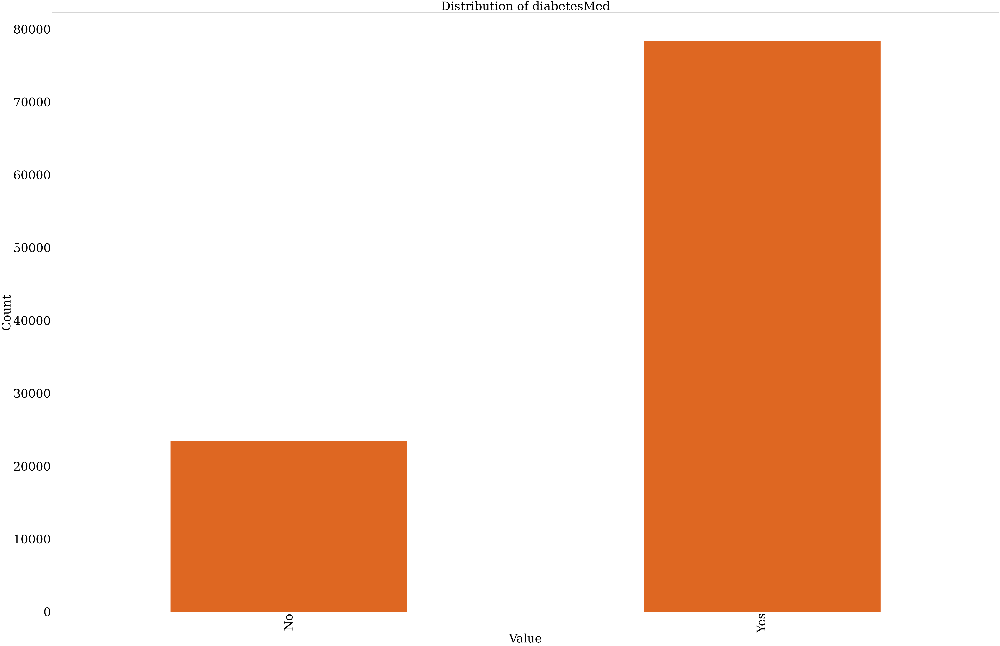

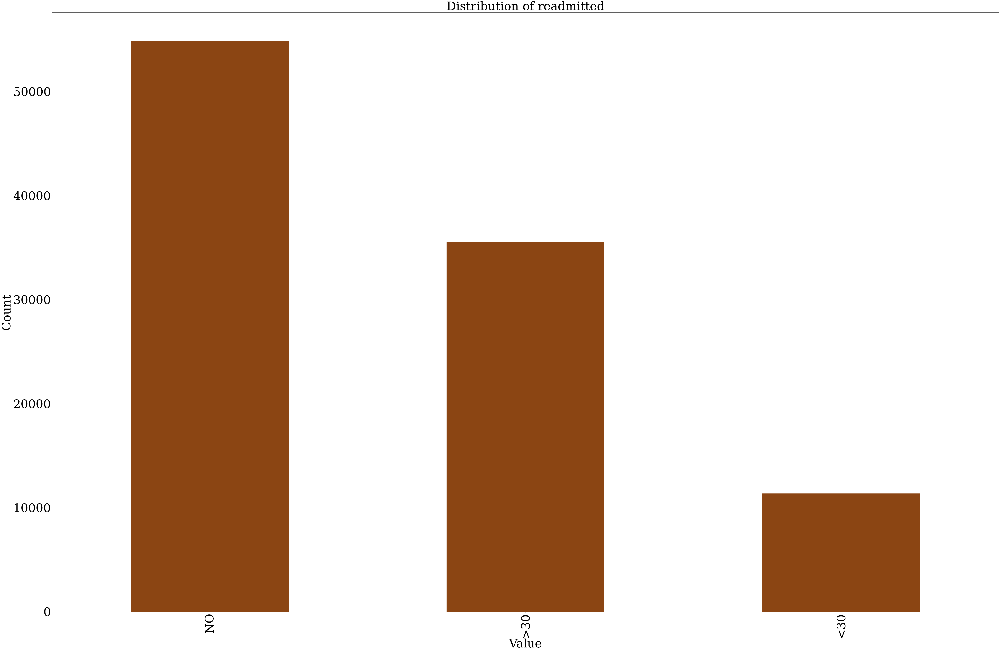

In [6]:
counter = 0
colors = ['#98f5ff', '#1cc32f', '#FF4040', '#9a34b5', '#1691a7', '#b5347e', '#e5d700', '#de6722', '#8B4513', '#C1FFC1'
          , '#ae8b0c', '#ff796c'] 

bad_columns = ["encounter_id", "patient_nbr", "diag_1", "diag_2", "diag_3"]

for column in diabetic_data:
    if column not in bad_columns:
        diabetic_data[column].value_counts(sort=False).plot.bar(color = colors[counter % 12],figsize=(100,65),fontsize=70)
        plt.xlabel("Value",fontsize=70) 
        plt.ylabel("Count",fontsize=70) 
        plt.title("Distribution of " + column,fontsize=70) 
        plt.show()
        counter += 1

### K-means input data requirements:
* Numerical variables only. K-means uses distance-based measurements to determine the similarity between data points. If you have categorical data, use K-modes clustering, if data is mixed, use K-prototype clustering.
* Data has no noises or outliers. K-means is very sensitive to outliers and noisy data. More detail here and here.
* Data has symmetric distribution of variables (it isn’t skewed). Real data always has outliers and noise, and it’s difficult to get rid of it. Transformation data to normal distribution helps to reduce the impact of these issues. In this way, it’s much easier for the algorithm to identify clusters.
* Variables on the same scale — have the same mean and variance, usually in a range -1.0 to 1.0 (standardized data) or 0.0 to 1.0 (normalized data). For the ML algorithm to consider all attributes as equal, they must all have the same scale. More detail here and here.
* There is no collinearity (a high level of correlation between two variables). Correlated variables are not useful for ML segmentation algorithms because they represent the same characteristic of a segment. So correlated variables are nothing but noise. More detail here.
* Few numbers of dimensions. As the number of dimensions (variables) increases, a distance-based similarity measure converges to a constant value between any given examples. The more variables the more difficult to find strict differences between instances.

Besides the requirements above, there are a few **fundamental model assumptions:**

* the variance of the distribution of each attribute (variable) is spherical (or in other words, the boundaries between k-means clusters are linear);
* all variables have the same variance;
* each cluster has roughly equal numbers of observations.

These assumptions are beyond the data preprocessing stage. There is no way to validate them before getting model results.

### Stages of Data preprocessing for K-means Clustering
1. Data Cleaning
  * Removing duplicates
  * Removing irrelevant observations and errors
  * Removing unnecessary columns
  * Handling inconsistent data
  * Handling outliers and noise
2. Handling missing data

3. Data Integration

4. Data Transformation

  * Feature Construction
  * Handling skewness
  * Data Scaling
5. Data Reduction

  * Removing dependent (highly correlated) variables
  * Feature selection
  * PCA

#### Data Cleaning: Removing unnecessary columns
Columns that don’t actually fit the specific problem that you’re trying to solve.

We drop columns that have many missing values.

In [7]:
# drop_columns = ["encounter_id", "patient_nbr", "race", "weight", "payer_code", "medical_specialty", "diag_1", "diag_2", "diag_3"]
drop_columns = ["patient_nbr", "weight", "payer_code", "medical_specialty"]
df_cleaned = diabetic_data.drop(columns=drop_columns)

We also drop rows that contain `NAN` values.

In [8]:
df_cleaned = df_cleaned.dropna()

encounter_id = df_cleaned["encounter_id"].copy().to_frame()
df_cleaned = df_cleaned.drop(columns=["encounter_id"])
df_cleaned

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
1,Caucasian,Female,[10-20),1,1,7,3,59,0,18,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),1,1,7,2,11,5,13,...,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),1,1,7,2,44,1,16,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),1,1,7,1,51,0,8,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
5,Caucasian,Male,[50-60),2,1,2,3,31,6,16,...,No,Steady,No,No,No,No,No,No,Yes,>30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,AfricanAmerican,Male,[70-80),1,3,7,3,51,0,16,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,AfricanAmerican,Female,[80-90),1,4,5,5,33,3,18,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,Caucasian,Male,[70-80),1,1,7,1,53,0,9,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,Caucasian,Female,[80-90),2,3,7,10,45,2,21,...,No,Up,No,No,No,No,No,Ch,Yes,NO


#### Data Cleaning: Handling inconsistent data
There are could be various situations here. At first, you need to observe your data.In truth, this operation relates to the transformation step. But I do it here, because at the step of handling missing values, it's often convenient not to have inconsistent data.

There are different ways for handling categirical data.
* <b>Label Encoders:</b> Assigining numbers to each categorical value. 
* <b>One Hot Encoding:</b>  The basic strategy is to convert each category value into a new column and assigns a 1 or 0 (True/False) value to the column. This has the benefit of not weighting a value improperly but does have the downside of adding more columns to the data set. There are also other ways but here we choose to apply one Hot-Encode to categorical variables.
* <b>Ordinal Encoding:</b> We use this categorical data encoding technique when the categorical feature is ordinal. In this case, retaining the order is important. Hence encoding should reflect the sequence.

Label Encoders aren't a good option when we have no particular ordering in our categories. In these cases, we can use One Hot Encoding which takes a lot of memory since it is adding a new column for each new category. We use Ordinal Encoding because its give us better features.

In [9]:
pd.options.mode.chained_assignment = None

numerical_cols = list(df_cleaned._get_numeric_data().columns)
categorical_cols = [x for x in list(df_cleaned.columns) if x not in numerical_cols] 
ord_enc = OrdinalEncoder()
df_cleaned[categorical_cols] = ord_enc.fit_transform(df_cleaned[categorical_cols].astype(str))
df_cleaned

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
1,2.0,0.0,1.0,1,1,7,3,59,0,18,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,0.0,0.0,2.0,1,1,7,2,11,5,13,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
3,2.0,1.0,3.0,1,1,7,2,44,1,16,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0
4,2.0,1.0,4.0,1,1,7,1,51,0,8,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0
5,2.0,1.0,5.0,2,1,2,3,31,6,16,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,0.0,1.0,7.0,1,3,7,3,51,0,16,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
101762,0.0,0.0,8.0,1,4,5,5,33,3,18,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
101763,2.0,1.0,7.0,1,1,7,1,53,0,9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0
101764,2.0,0.0,8.0,2,3,7,10,45,2,21,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0


#### Data Transformation: Data Scaling

We use *Normalization* to put all the features in the same range.

min_max scaler is a way to get data in the range 0 to 1.

In [10]:
dataset_df = df_cleaned.copy()

min_max_scaler = MinMaxScaler()

for col in dataset_df:
#     dataset_df[col] = (dataset_df[col]-dataset_df[col].min())/(dataset_df[col].max()-dataset_df[col].min()) # dataset_df[col].std()
    dataset_df[[col]] = min_max_scaler.fit_transform(dataset_df[[col]])

dataset_df

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
1,0.5,0.0,0.111111,0.000000,0.000000,0.250000,0.153846,0.442748,0.000000,0.2125,...,0.0,1.000000,0.333333,0.0,0.0,0.0,0.0,0.0,1.0,0.5
2,0.0,0.0,0.222222,0.000000,0.000000,0.250000,0.076923,0.076336,0.833333,0.1500,...,0.0,0.333333,0.333333,0.0,0.0,0.0,0.0,1.0,1.0,1.0
3,0.5,0.5,0.333333,0.000000,0.000000,0.250000,0.076923,0.328244,0.166667,0.1875,...,0.0,1.000000,0.333333,0.0,0.0,0.0,0.0,0.0,1.0,1.0
4,0.5,0.5,0.444444,0.000000,0.000000,0.250000,0.000000,0.381679,0.000000,0.0875,...,0.0,0.666667,0.333333,0.0,0.0,0.0,0.0,0.0,1.0,1.0
5,0.5,0.5,0.555556,0.142857,0.000000,0.041667,0.153846,0.229008,1.000000,0.1875,...,0.0,0.666667,0.333333,0.0,0.0,0.0,0.0,1.0,1.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,0.0,0.5,0.777778,0.000000,0.074074,0.250000,0.153846,0.381679,0.000000,0.1875,...,0.0,0.000000,0.333333,0.0,0.0,0.0,0.0,0.0,1.0,0.5
101762,0.0,0.0,0.888889,0.000000,0.111111,0.166667,0.307692,0.244275,0.500000,0.2125,...,0.0,0.666667,0.333333,0.0,0.0,0.0,0.0,1.0,1.0,1.0
101763,0.5,0.5,0.777778,0.000000,0.000000,0.250000,0.000000,0.396947,0.000000,0.1000,...,0.0,0.000000,0.333333,0.0,0.0,0.0,0.0,0.0,1.0,1.0
101764,0.5,0.0,0.888889,0.142857,0.074074,0.250000,0.692308,0.335878,0.333333,0.2500,...,0.0,1.000000,0.333333,0.0,0.0,0.0,0.0,0.0,1.0,1.0


#### Data Cleaning: Removing unnecessary columns
Columns that don’t actually fit the specific problem that you’re trying to solve.

The `nunique` function of *pandas.DataFrame* Count number of distinct elements in specified axis.
Return Series with number of distinct elements. Can ignore NaN values.

We count number of distinct elements in each columns and then drop the columns that have one distinct element. 

In [11]:
dataset_df_nunique = dataset_df.nunique()
columns_with_one_distinct_element = dataset_df_nunique[dataset_df_nunique == 1].index
dataset_df = dataset_df.drop(columns_with_one_distinct_element, axis=1)

#### Data Cleaning: Handling (drop) outliers and noise
Note: dropping is only one of techniques to handle with outliers.

`3` means that `99.7%` of the data is saved to get more smooth data, you can set `2` or `1` for this value.

You can think of this problem as basically trying to find dense areas inside a cloud with noise.

This is not the only possible solution but you could use a clustering algorithm, and specifically one that tries to find dense areas such as DBSCAN.

In [12]:
z_scores = np.abs(stats.zscore(dataset_df))
outliers_threshold = 3  # 3 means that 99.7% of the data is saved to get more smooth data, you can set 2 or 1 for this value
mask = (z_scores <= outliers_threshold).all(axis=1)
encounter_id = encounter_id[mask]
dataset_df = dataset_df[mask]
dataset_df

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
2,0.0,0.0,0.222222,0.000000,0.000000,0.250000,0.076923,0.076336,0.833333,0.1500,...,0.0,0.0,0.333333,0.333333,0.0,0.0,0.0,1.0,1.0,1.0
3,0.5,0.5,0.333333,0.000000,0.000000,0.250000,0.076923,0.328244,0.166667,0.1875,...,0.0,0.0,1.000000,0.333333,0.0,0.0,0.0,0.0,1.0,1.0
4,0.5,0.5,0.444444,0.000000,0.000000,0.250000,0.000000,0.381679,0.000000,0.0875,...,0.0,0.0,0.666667,0.333333,0.0,0.0,0.0,0.0,1.0,1.0
5,0.5,0.5,0.555556,0.142857,0.000000,0.041667,0.153846,0.229008,1.000000,0.1875,...,0.0,0.0,0.666667,0.333333,0.0,0.0,0.0,1.0,1.0,0.5
7,0.5,0.5,0.777778,0.000000,0.000000,0.250000,0.307692,0.549618,0.000000,0.1375,...,0.0,0.0,0.333333,0.333333,0.0,0.0,0.0,1.0,1.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101759,0.5,0.5,0.888889,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.1750,...,0.0,0.0,1.000000,0.333333,0.0,0.0,0.0,0.0,1.0,1.0
101761,0.0,0.5,0.777778,0.000000,0.074074,0.250000,0.153846,0.381679,0.000000,0.1875,...,0.0,0.0,0.000000,0.333333,0.0,0.0,0.0,0.0,1.0,0.5
101762,0.0,0.0,0.888889,0.000000,0.111111,0.166667,0.307692,0.244275,0.500000,0.2125,...,0.0,0.0,0.666667,0.333333,0.0,0.0,0.0,1.0,1.0,1.0
101763,0.5,0.5,0.777778,0.000000,0.000000,0.250000,0.000000,0.396947,0.000000,0.1000,...,0.0,0.0,0.000000,0.333333,0.0,0.0,0.0,0.0,1.0,1.0


#### Data Reduction: Removing dependent (highly correlated) variables

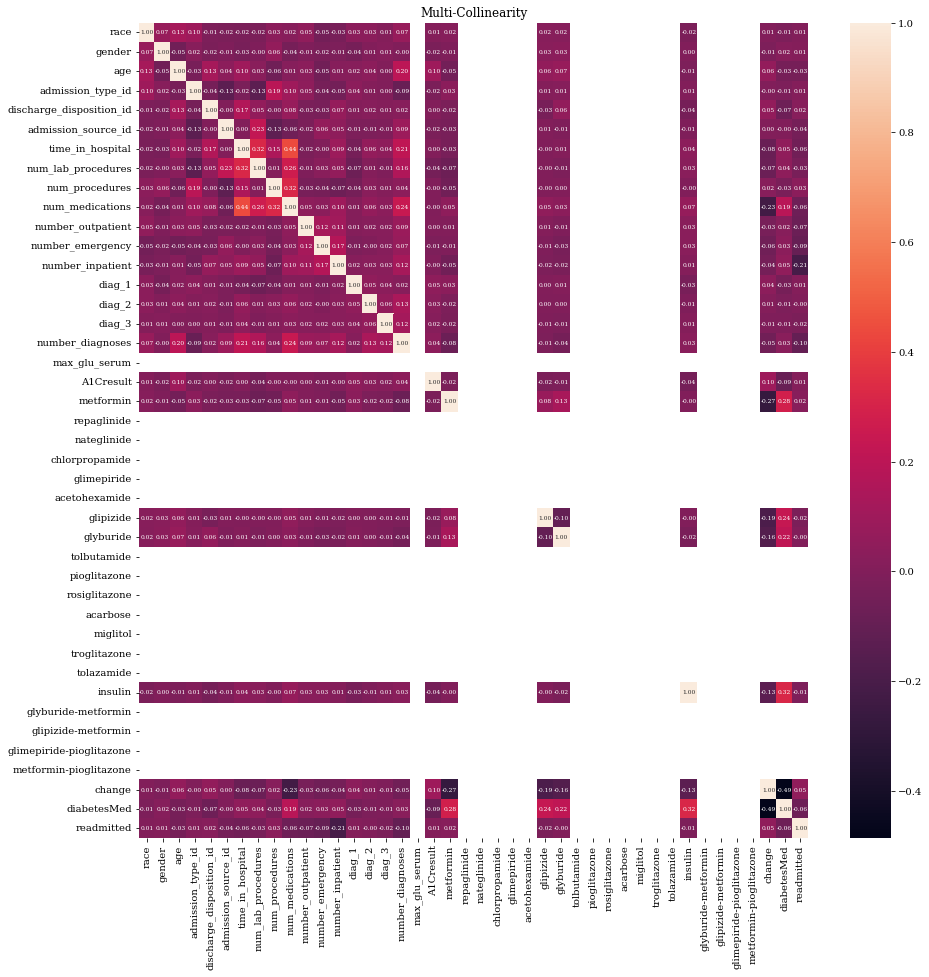

In [13]:
corr = dataset_df.corr()
plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True, fmt=".2f", annot_kws={"fontsize":6})
plt.title("Multi-Collinearity")
plt.show()

#### Data Reduction: PCA
Some algorithms such as KMeans find it difficult to accurately construct clusters if the dataset has too many features (ie. high dimensionality). High dimensionality does not necessarily mean hundreds or even thousands of features. Even 10 features can create accuracy issues.

The theory behind feature or dimensionality reduction is to convert the original feature set into fewer artificially derived features which still maintain most of the information encompassed in the original features.

One of the most prevalent feature reduction techniques is Principal Component Analysis or PCA. PCA reduces the original dataset into a specified number of features which PCA calls principal components. We have to select the number of principal components we wish to see. We discuss feature reduction in my article on KMeans clustering and I strongly advise you to take a look.

Do it if you still have a lot of variables or you can't select variables manually or segmentation results isn't good

`0.95` means that we will save `95%` useful information you can play with this parameter for getting better results

In [14]:
pca = PCA(n_components=2)
numpy_arr = pca.fit_transform(dataset_df)
X = pd.DataFrame(data=numpy_arr)
X

,0,1
0,-0.077694,0.333542
1,0.727273,-0.132537
2,0.700082,-0.223289
3,-0.007512,0.513118
4,-0.025141,0.439147
...,...,...
61330,0.715498,-0.112479
61331,0.652423,-0.349449
61332,-0.032742,0.448999
61333,0.604609,-0.436333


## Part 2: Clustering 

### Silhouette
The **silhouette Method** is also a method to find the optimal number of clusters and interpretation and validation of consistency within clusters of data. The silhouette method computes silhouette coefficients of each point that measure how much a point is similar to its own cluster compared to other clusters. by providing a **succinct graphical representation** of how well each object has been classified.

The silhouette coefficient is a measure of how similar a data point is within-cluster (cohesion) compared to other clusters (separation).

* Select a range of values of k (say 1 to 10).
* Plot Silhouette coefﬁcient for each value of K.

The range of the Silhouette value is between +1 and -1. A **high value is desirable** and indicates that the point is placed in the correct cluster. If many points have a negative Silhouette value, it may indicate that we have created too many or too few clusters.

The equation for calculating the silhouette coefﬁcient for a particular data point:

$$S(i) = \dfrac{b(i)-a(i)}{max(a(i), b(i))} $$

* S(i) is the silhouette coefficient of the data point i.
* a(i) is the average distance between i and all the other data points in the cluster to which i belongs.
* b(i) is the average distance from i to all clusters to which i does not belong.

We will then calculate the average_silhouette for every k.

$$ AverageSilhouette = mean(S(i)) $$

Then plot the graph between average_silhouette and K.

Points to remember while calculating silhouette coefficient:
* The value of the silhouette coefﬁcient is between [-1, 1].
* A score of 1 denotes the best meaning that the data point i is very compact within the cluster to which it belongs and far away from the other clusters.
* The worst value is -1. Values near 0 denote overlapping clusters.

There are two things to consider here:

* If we have the ground truth labels (class information) of the data points available with us then we can make use of extrinsic methods like homogeneity score, completeness score and so on.
* But if we do not have the ground truth labels of the data points, we will have to use the intrinsic methods like silhouette score which is based on the silhouette coefﬁcient. We now study this evaluation metric in a bit more details.

### K-means
K-means clustering is an unsupervised algorithm. In an unsupervised algorithm, we are not interested in making predictions (since we don’t have a target/output variable). The objective is to discover interesting patterns in the data, e.g., are there any subgroups or *clusters* among the *bank*s customers?

Clustering techniques use raw data to form clusters based on common factors among various data points. Customer segmentation for targeted marketing is one of the most vital applications of the clustering algorithm.

Hyperparameters are model configurations properties that define the model and remain constants during the training of the model. The design of the model can be changed by tuning the hyperparameters. For K-Means clustering there are 3 main hyperparameters to set-up to define the best configuration of the model:

* Initial values of clusters
* Distance measures
* Number of clusters

Initial values of clusters greatly impact the clustering model, there are various algorithms to initialize the values. Distance measures are used to find points in clusters to the cluster center, different distance measures yield different clusters.

The number of clusters **(k)** is the most important hyperparameter in K-Means clustering. If we already know beforehand, the number of clusters to group the data into, then there is no use to tune the value of k. For example, k=10 for the MNIST digit classification dataset.

Let us see the python code with help of an example.

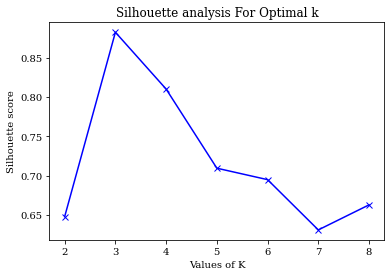

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
silhouette_avg = []
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_
    silhouette_avg.append(silhouette_score(X, cluster_labels))
    
plt.plot(range_n_clusters,silhouette_avg,"bx-")
plt.xlabel("Values of K") 
plt.ylabel("Silhouette score") 
plt.title("Silhouette analysis For Optimal k")
plt.show()

We see that the silhouette score is maximized at k = 3. So, we will take 3 clusters.

**NOTE:** The silhouette Method is used in combination with the Elbow Method for a more confident decision.

In k-means clustering, the number of clusters that you want to divide your data points into i.e., the value of K has to be pre-determined whereas in Hierarchical clustering data is automatically formed into a tree shape form (dendrogram).

So how do we decide which clustering to select? We choose either of them depending on our problem statement and business requirement.

Hierarchical clustering gives you a deep insight into each step of converging different clusters and creates a dendrogram. It helps you to figure out which cluster combination makes more sense.

Silhouette analysis can be used to study the separation distance between the resulting clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. This measure has a range of [-1, 1].

Silhouette coefficients (as these values are referred to as) near +1 indicate that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster.

In this example the silhouette analysis is used to choose an optimal value for `n_clusters`. The silhouette plot shows that the `n_clusters` value of 3, 5 and 6 are a bad pick for the given data due to the presence of clusters with below average silhouette scores and also due to wide fluctuations in the size of the silhouette plots. Silhouette analysis is more ambivalent in deciding between 2 and 4.

Also from the thickness of the silhouette plot the cluster size can be visualized. The silhouette plot for cluster 0 when `n_clusters` is equal to 2, is bigger in size owing to the grouping of the 3 sub clusters into one big cluster. However when the `n_clusters` is equal to 4, all the plots are more or less of similar thickness and hence are of similar sizes as can be also verified from the labelled scatter plot on the right.

For n_clusters = 2 The average silhouette_score is : 0.6480291797801935
For n_clusters = 3 The average silhouette_score is : 0.8820749726948328
For n_clusters = 4 The average silhouette_score is : 0.809966140829234
For n_clusters = 5 The average silhouette_score is : 0.7095129194266505
For n_clusters = 6 The average silhouette_score is : 0.6944675643510155
For n_clusters = 7 The average silhouette_score is : 0.6307002308706838
For n_clusters = 8 The average silhouette_score is : 0.6631086931458796


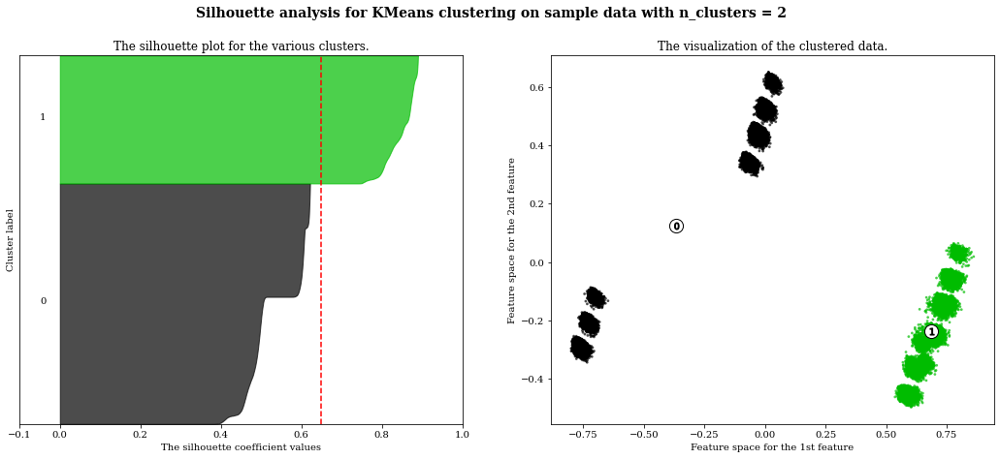

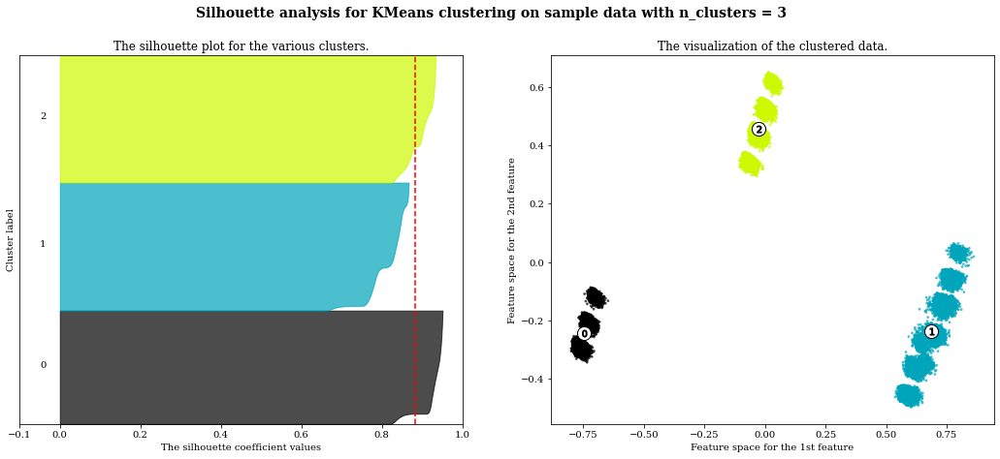

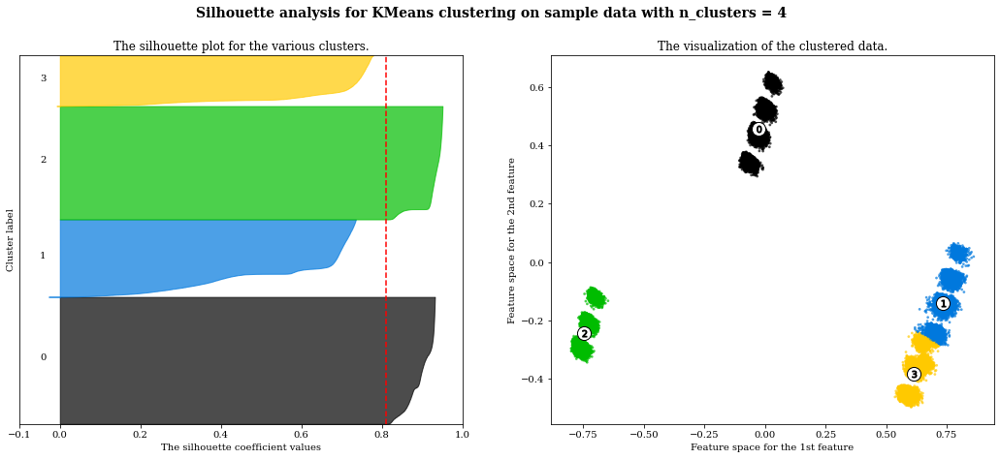

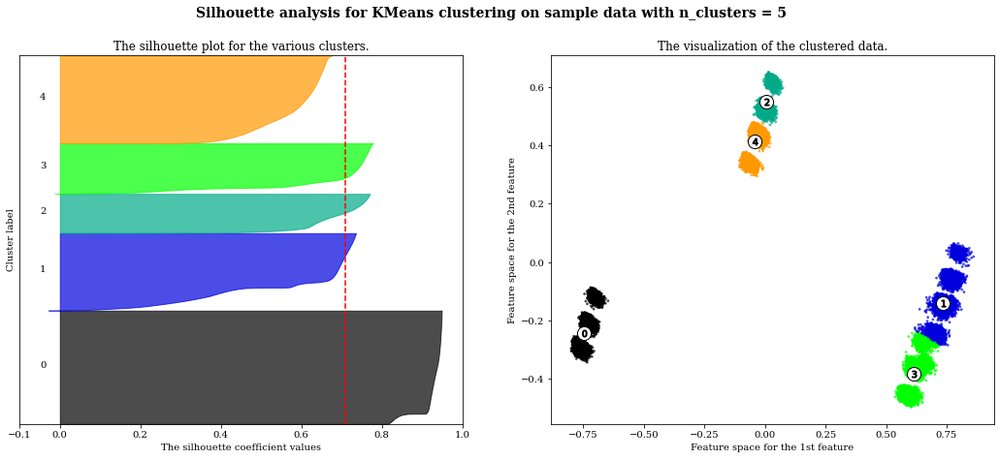

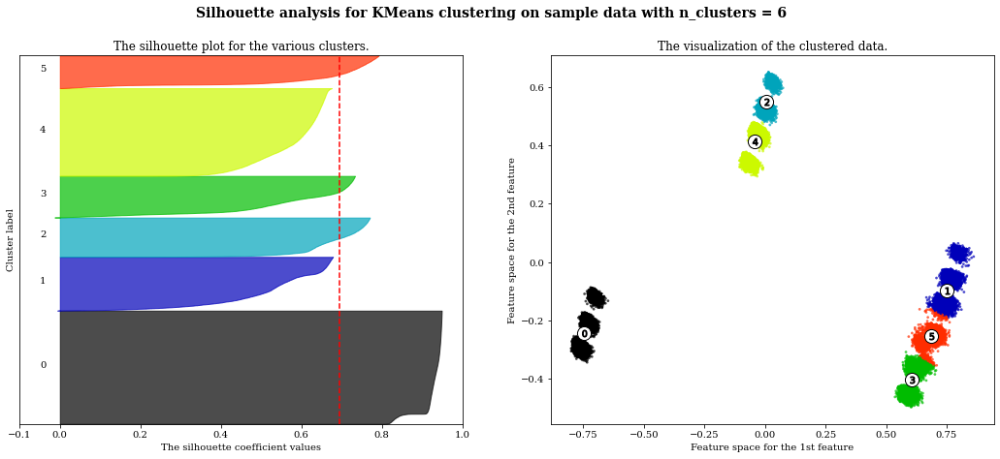

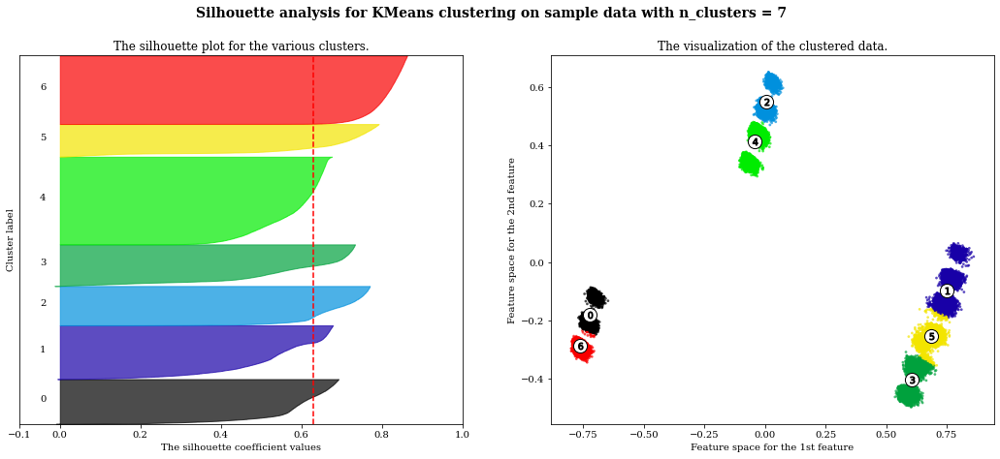

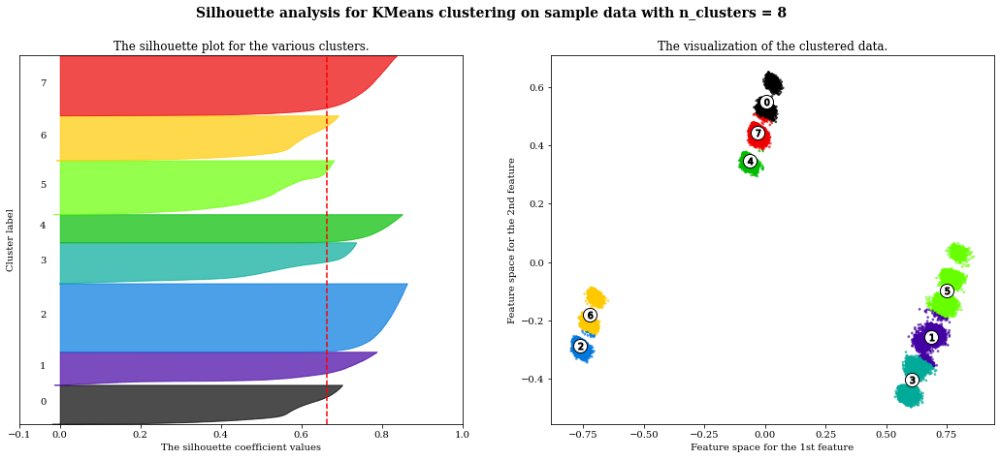

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =",n_clusters,"The average silhouette_score is :",silhouette_avg,)
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7,)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X.iloc[:, 0], X.iloc[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0],centers[:, 1],marker="o",c="white",alpha=1,s=200,edgecolor="k",)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")
    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters,fontsize=14,fontweight="bold",)
plt.show()

#### Analysis
Here is the **Silhouette analysis** done on the above plots to **select an optimal value for n_clusters.**

* The value of n_clusters as 5 and 6 looks to be suboptimal for the given data due to the following reasons:
  * Presence of clusters with below-average silhouette scores 
  * **Wide fluctuations in the size** of the silhouette plots.
* The value of 3 and 4 for n_clusters looks to be the optimal one. The silhouette score for each cluster is above average silhouette scores. Also, the fluctuation in size is similar. **The thickness of the silhouette plot representing each cluster also is a deciding point.** For the plot with n_cluster 3 (top right), the thickness is more uniform than the plot with n_cluster as 2 (top left) with one cluster thickness much more than the other. **Thus, one can select the optimal number of clusters as 3.**

In above all pictures , we can clearly see that how plot and score are different according to n_cluster(k) . So, we can easily choose high score and number of k via silhouette analysis technique instead of elbow technique.



In [17]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
cluster_labels = kmeans.labels_
encounter_id["K-means labels"] = cluster_labels
encounter_id

,encounter_id,K-means labels
2,64410,2
3,500364,1
4,16680,1
5,35754,2
7,63768,2
...,...,...
101759,443842778,1
101761,443847548,1
101762,443847782,2
101763,443854148,1


#### Conclusion:

K-means clustering is a simplest and popular unsupervised machine learning algorithms . We can evaluate the algorithm by two ways such as elbow technique and silhouette technique . We saw differences between them above . I think silhouette technique gives us more precise score and number of k for k-means algorithm . However , we can also use elbow technique for quick response and intuition.

Here is the summary of what you learned in this post in relation to silhouette score concepts:

* Silhouette score for a set of sample data points is used to measure how dense and well-separated the clusters are.
* Silhouette score takes into consideration the intra-cluster distance between the sample and other data points within the same cluster (a) and inter-cluster distance between the sample and the next nearest cluster (b).
* The silhouette score falls within the range [-1, 1].
* The silhouette score of 1 means that the clusters are very dense and nicely separated. The score of 0 means that clusters are overlapping. * The score of less than 0 means that data belonging to clusters may be * wrong/incorrect.
* The silhouette plots can be used to select the most optimal value of the K (no. of cluster) in K-means clustering.
* The aspects to look out for in Silhouette plots are cluster scores below the average silhouette score, wide fluctuations in the size of the clusters, and also the thickness of the silhouette plot.

### DBSCAN
**Density-based spatial clustering of applications with noise (DBSCAN)** is an unsupervised clustering ML algorithm. Unsupervised in the sense that it does not use pre-labeled targets to cluster the data points. Clustering in the sense that it attempts to group similar data points into artificial groups or clusters. It is an alternative to popular clustering algorithms such as KMeans and hierarchical clustering.

#### KMeans vs DBSCAN
KMeans is especially vulnerable to outliers. As the algorithm iterates through centroids, outliers have a significant impact on the way the centroids moves before reaching stability and convergence. Furthermore, KMeans has problems accurately clustering data where the clusters are of different sizes and densities. K-Means can only apply spherical clusters and its accuracy will suffer if the data is not spherical. Last but not least, KMeans requires us to first select the number of clusters we wish to find. Below is an example of how KMeans and DBSCAN would individually cluster the same dataset.

On the other hand, DBSCAN does not require us to specify the number of clusters, avoids outliers, and works quite well with arbitrarily shaped and sized clusters. It does not have centroids, the clusters are formed by a process of linking neighbor points together.

#### How Does DBSCAN do its Magic?
First, let’s define **Epsilon** and **Minimum Points**, two required parameters when applying the DBSCAN algorithm, and some additional terminology.

1. **Epsilon (ɛ):** Max radius of the neighborhood. Data points will be valid neighbors if their mutual distance is less than or equal to the specified epsilon. In other words, it is the distance that DBSCAN uses to determine if two points are similar and belong together. A larger epsilon will produce broader clusters (encompassing more data points) and a smaller epsilon will build smaller clusters. In general, we prefer smaller values because we only want a small fraction of data points within the epsilon distance from each other. Too small and you’ll begin to split valid clusters into smaller and smaller clusters. Too big and you’ll aggregate valid clusters into 2–3 massive clusters with little business insights.
2. **Minimum Points (minPts):** The minimum number of data points within the radius of a neighborhood (ie. epsilon) for the neighborhood to be considered a cluster. Keep in mind that the initial point is included in the minPts. A low minPts help the algorithm build more clusters with more noise or outliers. A higher minPts will ensure more robust clusters but if it’s too large smaller clusters will be incorporated into larger clusters.

#### Additional Terminology
**Core Points:** Core data points have at least minPts number of data points within their epsilon distance.

**Border Points:** Border data points are on the outskirts as they are in the neighborhood (ie. w/in epsilon distance of core point) but have less than the required minPts.

**Outlier Points:** These points are not part of a neighborhood (ie. more than epsilon distance) and are not border points. These are points located in low-density areas.

First, a random point is selected which has at least minPts within its epsilon radius. Then each point that is within the neighborhood of the core point is evaluated to determine if it has the minPts nearby within the epsilon distance (minPts includes the point itself). If the point does meet the minPts criteria it becomes another core point and the cluster expands. If a point does not meet the minPts criteria it becomes a border point. As the process continues a chain begins to develop as core point “a” is a neighbor of “b” which is a neighbor or “c” and so on. The cluster is complete as it becomes surrounded by border points because there are no more points within the epsilon distance. A new random point is selected and the process repeats to identify the next cluster.

#### How to Determine Optimal Epsilon Value
One method used to estimate the optimal epsilon value is to use nearest neighbor distances. If you recall, nearest neighbors is a supervised ML clustering algorithm which clusters new data points based on their distance from other “known” data points. We train a KNN model on labeled training data to determine which data points belong to which cluster. Then when we apply the model to new data, the algorithm determines which cluster the new data point belongs to based on the distance to trained clusters. We do have to determine the “k” parameter a-priori which specifies how many closest or nearest neighboring points the model will consider before assigning the new data point to a cluster.

To determine the best epsilon value, we calculate the average distance between each point and its closest/nearest neighbors. We then plot a k-distance and choose the epsilon value at the “elbow” of the graph. On the y-axis, we plot the average distances and the x-axis all the data points in your dataset.

if epsilon is chosen much too small, a large part of the data will not be clustered, whereas a high epsilon value clusters will merge and the majority of data points will be in the same cluster. In general, small values of epsilon are preferable, and as a rule of thumb, only a small fraction of points should be within this distance of each other.

#### How to Determine Optimal minPts
Typically, we should set minPts to be greater or equal to the number of dimensionality of our dataset. That said, we often see folks multiplying the number of features X 2 to determine their minPts value.

Much like the “Elbow Method” used to determine the optimal epsilon value the minPts heuristic isn’t correct 100% of the time.

#### Pros of DBSCAN
* Does not require us to pre-determine the number of clusters like KMeans
* Handles outliers like a champ
* Can separate high density data into small clusters
* Can cluster non-linear relationships (finds arbitrary shapes)

#### Cons of DBSCAN
* Struggles to identify clusters within data of varying density
* Can suffer with high dimensional data
* Very sensitive to epsilon and minimum points parameters

In [20]:
# eps_list=np.arange(start=0.1, stop=0.9, step=0.01)
# eps_list=np.arange(start=0.1, stop=0.5, step=0.1)
eps_list=[0.01,0.025,0.05,0.075,0.1,0.15,0.2,0.25]
min_sample_list=np.arange(start=2, stop=5, step=1)
silhouette_scores_data=pd.DataFrame(columns=['score', 'eps', 'min_samples'])
 
for eps_trial in eps_list:
    for min_sample_trial in min_sample_list:
        dbscan = DBSCAN(eps=eps_trial, min_samples=min_sample_trial)
        dbscan.fit(X)
        silhouette_scores_data = silhouette_scores_data.append({'score': silhouette_score(X, dbscan.labels_), 'eps': eps_trial, 'min_samples': min_sample_trial}, ignore_index=True)

silhouette_scores_data.sort_values(by='score', ascending=False)

,score,eps,min_samples
12,0.882074,0.100,2.0
13,0.882074,0.100,3.0
22,0.882074,0.250,3.0
21,0.882074,0.250,2.0
20,0.882074,0.200,4.0
19,0.882074,0.200,3.0
18,0.882074,0.200,2.0
17,0.882074,0.150,4.0
16,0.882074,0.150,3.0
15,0.882074,0.150,2.0


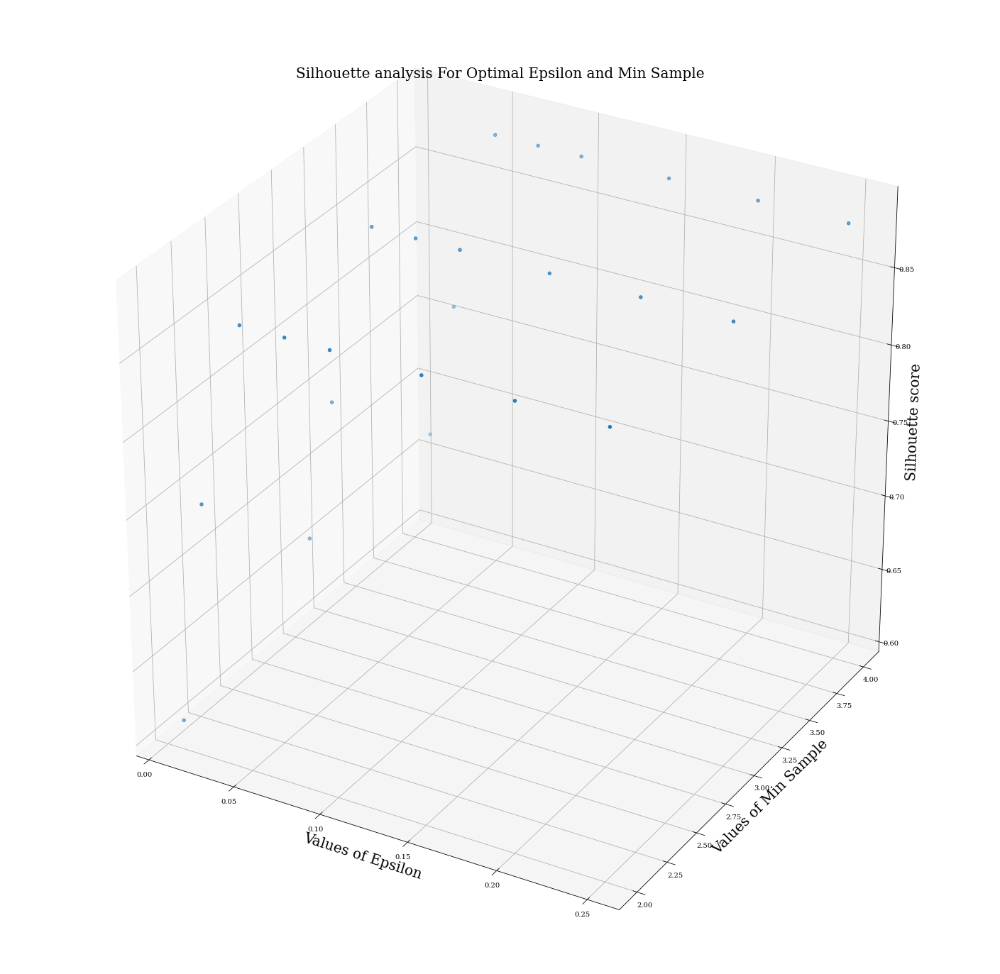

In [25]:
fig = plt.figure(figsize=(25, 25)).gca(projection='3d')
fig.scatter(silhouette_scores_data['eps'], silhouette_scores_data['min_samples'], silhouette_scores_data['score'])
fig.set_xlabel('Values of Epsilon',fontsize=20)
fig.set_ylabel('Values of Min Sample',fontsize=20)
fig.set_zlabel('Silhouette score',fontsize=20)
plt.title('Silhouette analysis For Optimal Epsilon and Min Sample',fontsize=20)
plt.show()

We can see that iterating through our epsilon and minimum values we had obtained a wide range of number of clusters and silhouette scores. Epsilon scores between 0.1 and 0.25 began to produce a manageable number of clusters. Increasing epsilon to 1.2 and above creates too few clusters to make much business sense. Furthermore, some of those clusters may be just noise (ie. -1) which we’ll get to in a bit.

It is also important to understand that increasing epsilon decreases the number of clusters but each cluster will also begin to encompass more outlier/noise data points. There is a certain level of diminishing returns.

It is also important to point out a frequent error you will surely encounter running this string of code. Sometimes when you have set your parameters (ie. eps_values and min_samples) too broad the for-loop will eventually come to a combination of eps_values and min_samples which only produces one cluster. However, the Silhouette_score function requires at least two clusters to be defined. You will need to restrict your parameters to avoid this issue.



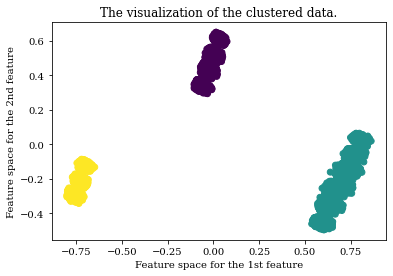

In [26]:
db = DBSCAN(eps=0.1, min_samples=2)
clustering_labels = db.fit_predict(X)

encounter_id["DBSCAN labels"] = clustering_labels

plt.scatter(x= X.iloc[:,0], y= X.iloc[:,1], c=clustering_labels)
plt.xlabel("Feature space for the 1st feature") 
plt.ylabel("Feature space for the 2nd feature") 
plt.title("The visualization of the clustered data.")
plt.show()

#### Summary
DBSCAN, a density clustering algorithm which is often used on non-linear or non-spherical datasets. Epsilon and Minimum Points are two required parameters. Epsilon is the radius within nearby data points that need to be in to be considered *similar* enough to begin a cluster. Finally, Minimum Points is the minimum number of data points that need to be inside the radius (ie. epsilon) before they can be considered a cluster.

### Save clustering result into a csv file

In [27]:
encounter_id.to_csv("clustering_labels.csv")
encounter_id

,encounter_id,K-means labels,DBSCAN labels
2,64410,2,0
3,500364,1,1
4,16680,1,1
5,35754,2,0
7,63768,2,0
...,...,...,...
101759,443842778,1,1
101761,443847548,1,1
101762,443847782,2,0
101763,443854148,1,1
